# Find Path Descriptors using Z space of Autoencoder

Autoencoder are good at:
- **dimensionality reduction** for data visualization
- **data denoising** for robust feature learning

Dimensions of Input space= n x 100 x 3
Dimensions of Latent space (z-space)= z

# Enhance reproducability of results

In [82]:
#%env PYTHONHASHSEED=0 
#%env CUDA_VISIBLE_DEVICES=""

In [83]:
import numpy as np
import tensorflow as tf
import random

np.random.seed(1)
random.seed(1)
tf.set_random_seed(1)

config = tf.ConfigProto(intra_op_parallelism_threads=1,inter_op_parallelism_threads=1)
from keras import backend as K
sess = tf.Session(graph=tf.get_default_graph(), config=config)
K.set_session(sess)

In [84]:
def resetRNG(seed_value):
    random.seed(seed_value)
    np.random.seed(seed_value)
    tf.set_random_seed(seed_value)

# Import .npz Database containing 5SS mechanisms and cplr paths

In [85]:
# Import data offline
import os
current_dir=os.getcwd()
db_path=os.path.join(current_dir,'..','1. DB Preprocessing','norm_database5SS.npz')
db = np.load(db_path)

In [86]:
# Import data on Google CoLab
#from google.colab import files
#uploaded = files.upload()
#db = np.load('norm_database5SS.npz')

In [87]:
print(db.files)
cplr=db['cplrData']
mech=db['mechData']

print(cplr.shape)
print(mech.shape)

['cplrData', 'mechData']
(1453, 100, 3)
(1453, 11, 3)


# Splitting the database in Train/Test dataset

In [88]:
x= cplr

# Split data into training and testing dataset
from sklearn.model_selection import train_test_split
x_train, x_test, _, _ = train_test_split(x, x, test_size=0.2, random_state=1)

# Functions to TRAIN an Autoencoder

In [89]:
from keras.layers import Input, Dense, Flatten, Reshape, SeparableConv1D, concatenate
from keras.models import Model
from keras.layers import LeakyReLU
from keras import regularizers
from keras.callbacks import ModelCheckpoint, EarlyStopping
#from keras import initializers
import keras

In [90]:
# Train same model architecture multiple times since the training process is stochastic

def AE_analysis(AE_model, iterations, x_train, x_test, filename='model'):
    val_loss_list=[]
    best_val_loss=np.inf;
    for i in range(iterations):
        AE, E = AE_model()
        val_loss, train_data=train_AE(AE, E, x_train, x_test)
        val_loss_list.append(val_loss)
        if best_val_loss>val_loss:
            best_AE=AE
            best_E=E
            best_train_data=train_data
            best_val_loss=val_loss
    
    # PRINT MEAN, VARIANCE and BEST MODEL METRICS
    print(val_loss_list)
    print(np.mean(val_loss_list))
    
    # SAVE BEST MODEL
    #f_val_loss=np.round_(best_train_data.history['val_loss'][-1],decimals=4)
    filepath=filename+'_val_loss_'+str(best_val_loss)+'.h5'
    filepath=os.path.join('models',filepath)
    best_AE.save(filepath)
    
    return best_AE, best_E, best_train_data

In [91]:
def train_AE(autoencoder, encoder, x_train, x_test, epochs=500):
    # TRAINING PHASE
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min',
                                  restore_best_weights=True)
    autoencoder_train=autoencoder.fit(x_train, x_train, epochs=epochs, batch_size=128, 
                                      shuffle=False, validation_data=(x_test, x_test), 
                                      verbose=0, callbacks=[earlyStopping])
    
    # TRAINING DATA
    val_loss = autoencoder_train.history['val_loss']
    f_val_loss=np.round_(val_loss[-1],decimals=4)
    
    return f_val_loss, autoencoder_train

In [92]:
# Test single Auto-encoder architecture

def testAutoEncoder(autoencoder, encoder, x_train, x_test, epochs=500, filepath='model'):
    
    # TRAINING PHASE
    autoencoder.summary()
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min',
                                  restore_best_weights=True)
    autoencoder_train=autoencoder.fit(x_train, x_train, epochs=epochs, batch_size=128, 
                                      shuffle=False, validation_data=(x_test, x_test), 
                                      verbose=0, callbacks=[earlyStopping])
    
    # TRAINING VISUALIZATION
    visualize_train_curves(autoencoder_train)
    
    # SAVE MODEL
    f_val_loss=np.round_(autoencoder_train.history['val_loss'][-1],decimals=4)
    filepath=filepath+'_val_loss_'+str(f_val_loss)+'.h5'
    filepath=os.path.join('models',filepath)
    autoencoder.save(filepath)
    
    # RECONSTRUCTION VISUALIZATION
    predicted_curve = autoencoder.predict(x_test)
    z_param = encoder.predict(x_test)
    #print(z_param)
    #print(predicted_curve)
    visualize_reconstructed_CplrCurves(x_test, predicted_curve, 20)
    
    return f_val_loss

# Functions to VISUALIZE an Autoencoder

In [93]:
def visualize_AE(AE, train_data, x_test):
    # VISUALIZING TRAINING CURVES
    visualize_train_curves(train_data)
    
    # VISUALIZE RECONSTRUCTED CURVES
    reconst_curve = AE.predict(x_test)
    visualize_reconstructed_CplrCurves(x_test, reconst_curve, 20)

    
def visualize_train_curves(train_data):
    loss = train_data.history['loss']
    val_loss = train_data.history['val_loss']
    
    f_loss=np.round_(loss[-1],decimals=4)
    f_val_loss=np.round_(val_loss[-1],decimals=4)
    
    print('Final Training loss: '+str(f_loss))
    print('Final Validation loss: '+str(f_val_loss))
    
    epochsRange = range(len(loss))
    plt.figure()
    plt.plot(epochsRange, loss, 'r', label='Training loss')
    plt.plot(epochsRange, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()

    
def visualize_reconstructed_CplrCurves(x_test, reconst_curve, n=10, b_spline=False):
    plt.figure(figsize=(3*n, 3))
    for i in range(n):
        ax = plt.subplot(1, n, i + 1, projection='3d')
        if b_spline:
            reconst_curve[i]=b_spline_interpolation(reconst_curve[i], 100)
        plotPath(reconst_curve[i], ax, 2,'r' )
        plotPath(x_test[i], ax, 2)
    plt.tight_layout()
    plt.show()

In [94]:
# Plotting Functions

#%matplotlib inline
%matplotlib notebook
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
from scipy import interpolate


def plotPath(Pts, ax, limit, color = 'gray'):
    xline=Pts[:,0]
    yline=Pts[:,1]
    zline=Pts[:,2]
    ax.plot3D(xline, yline, zline, color)
    ax.auto_scale_xyz([-limit, limit], [-limit, limit], [-limit, limit])

def plotXYZ(center, RotMat, ax):
    C=np.vstack((center,center,center))
    R=RotMat
    r=(1,0,0)
    g=(0,1,0)
    b=(0,0,1)
    ax.quiver(C[:,0], C[:,1], C[:,2], R[:,0], R[:,1], R[:,2],color=(r,g,b,r,r,g,g,b,b))


def b_spline_interpolation(inp_pts, out_n):
    # Fit cubic B-spline to the points
    xp=inp_pts[i,:,0]
    yp=inp_pts[i,:,1]
    zp=inp_pts[i,:,2]
        
    # Check for duplicate points as interpolation routine errors out
    okay = np.where(np.abs(np.diff(xp)) + np.abs(np.diff(yp)) + np.abs(np.diff(zp)) > 0)
    xp = np.r_[xp[okay], xp[-1]]
    yp = np.r_[yp[okay], yp[-1]]
    zp = np.r_[zp[okay], zp[-1]]
    
    tck, u =interpolate.splprep([xp,yp,zp],s=1)
    num_pts=out_n
    u_fine = np.linspace(0,1,num_pts)
    x_f, y_f, z_f = interpolate.splev(u_fine, tck)
    Path_f = np.vstack(([x_100],[y_100],[z_100])).T
    
    return Path_f

# 1. Effect of activation func: Sigmoid vs RELU vs LeakyRELU

First we try to find which activation function might perform better for our usecase i.e. describing 3D coupler paths. Each model is trained 10 times for 200 epochs and the best fit model results are reported. The Training Loss and Validation Loss after training are

| Activation Function | Final Training Loss | Final Validation Loss |
| ------------------- |:-------------------:| ---------------------:|
| Sigmoid             | 0.0071              | 0.0089                |
| RELU                | 0.0013              | 0.0026                |
| LeakyRELU           | 0.0010              | 0.0022                |


## 1.1 Autoencoder Sigmoid activation

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_26 (InputLayer)        (None, 100, 3)            0         
_________________________________________________________________
flatten_26 (Flatten)         (None, 300)               0         
_________________________________________________________________
dense_158 (Dense)            (None, 300)               90300     
_________________________________________________________________
dense_159 (Dense)            (None, 200)               60200     
_________________________________________________________________
dense_160 (Dense)            (None, 100)               20100     
_________________________________________________________________
dense_161 (Dense)            (None, 200)               20200     
_________________________________________________________________
dense_162 (Dense)            (None, 300)               60300     
__________

<IPython.core.display.Javascript object>


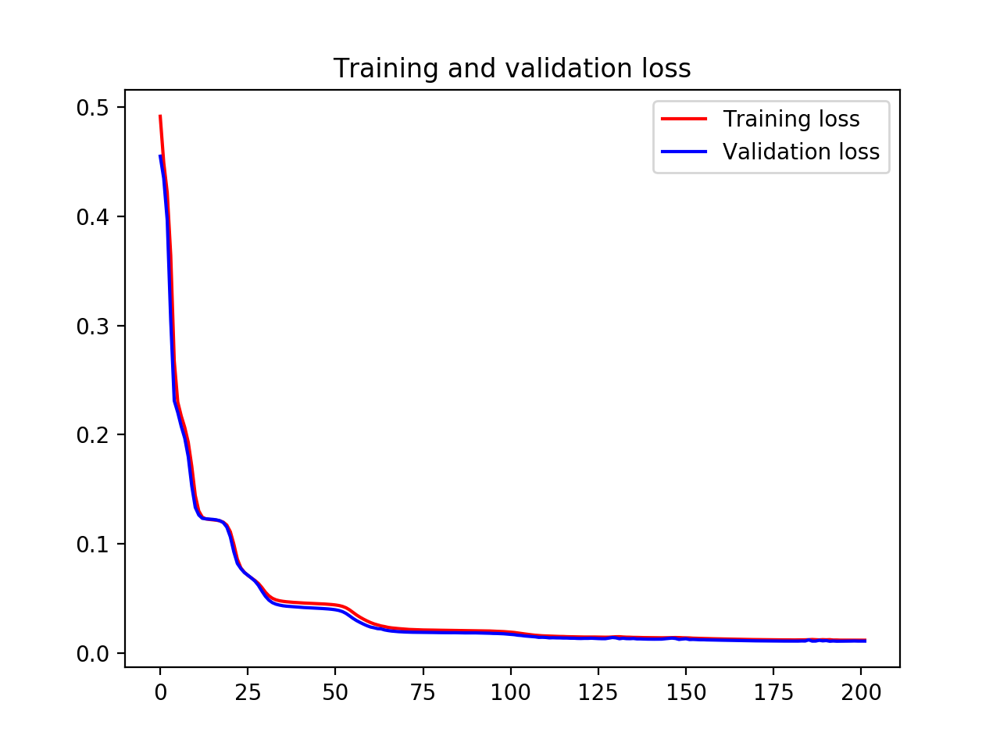

<IPython.core.display.Javascript object>


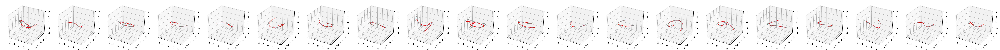

Restoring model weights from the end of the best epoch
Epoch 00228: early stopping
[0.0111]
0.0111
Final Training loss: 0.012
Final Validation loss: 0.0111


<IPython.core.display.Javascript object>


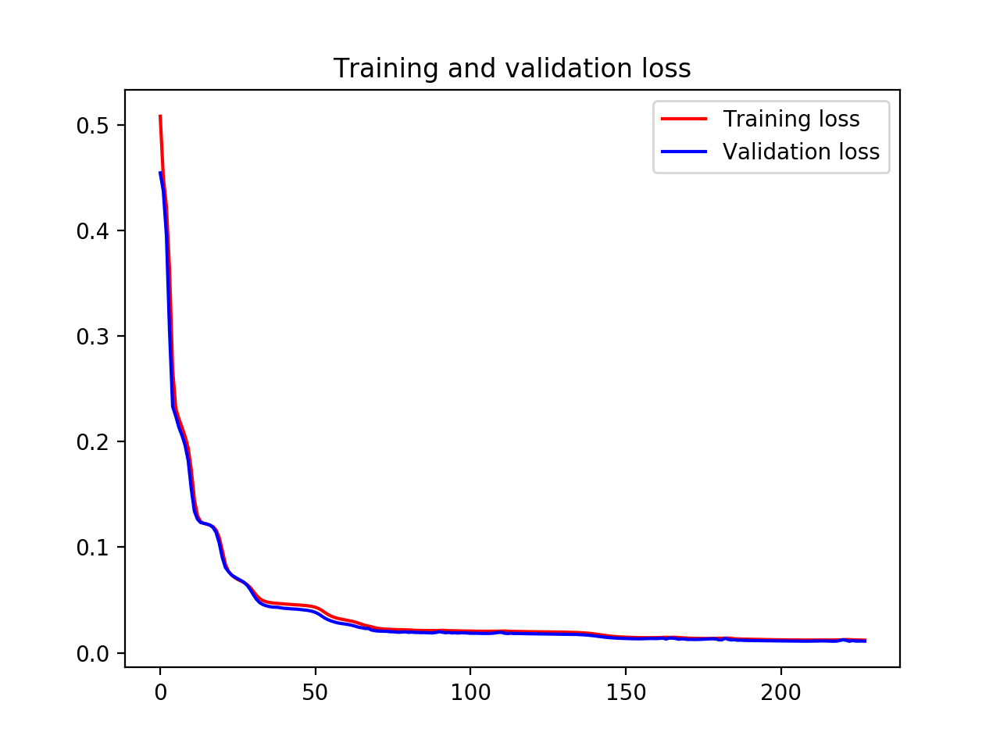

<IPython.core.display.Javascript object>


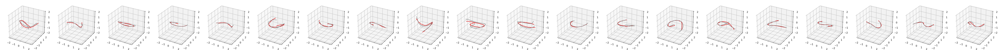

In [95]:
def autoEncoderSig():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300, activation='sigmoid')(x)
    x=Dense(200, activation='sigmoid')(x)
    encoded=Dense(100, activation='sigmoid')(x)

    # Decoding
    x=Dense(200, activation='sigmoid')(encoded)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderSig, encoderSig=autoEncoderSig()
testAutoEncoder(autoencoderSig, encoderSig, x_train, x_test, filepath='AE_Sig')

AE,E,train_data =AE_analysis(autoEncoderSig, 1, x_train, x_test, filename='AE_Sig')
visualize_AE(AE, train_data, x_test)

## 1.2 Autoencoder RELU activation

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        (None, 100, 3)            0         
_________________________________________________________________
flatten_11 (Flatten)         (None, 300)               0         
_________________________________________________________________
dense_67 (Dense)             (None, 300)               90300     
_________________________________________________________________
dense_68 (Dense)             (None, 200)               60200     
_________________________________________________________________
dense_69 (Dense)             (None, 100)               20100     
_________________________________________________________________
dense_70 (Dense)             (None, 200)               20200     
_________________________________________________________________
dense_71 (Dense)             (None, 300)               60300     
__________

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


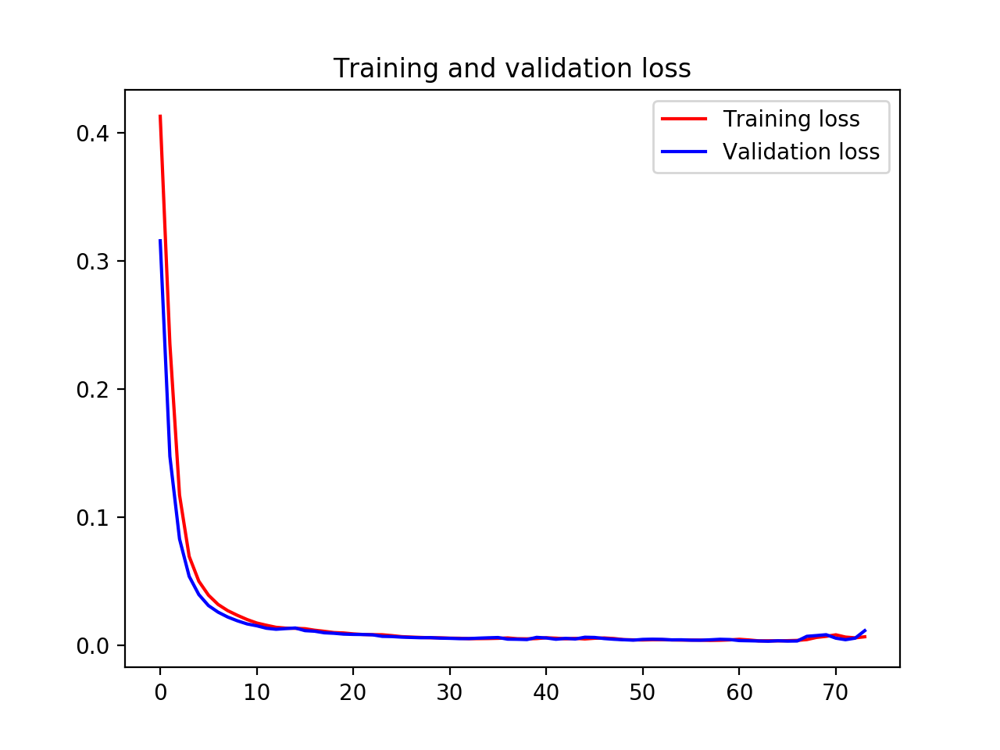

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


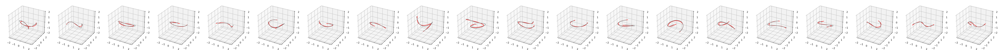

In [23]:
def autoEncoderRELU():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300, activation='sigmoid')(x)
    x=Dense(200, activation='relu')(x)
    encoded=Dense(100, activation='relu')(x)

    # Decoding
    x=Dense(200, activation='relu')(encoded)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderRELU, encoderRELU=autoEncoderRELU()
testAutoEncoder(autoencoderRELU, encoderRELU, x_train, x_test, filepath='AE_RELU')

## 1.3 Autoencoder LeakyRELU activation

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 300)               90300     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 300)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 200)               60200     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 200)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 100)               20100     
__________

<IPython.core.display.Javascript object>


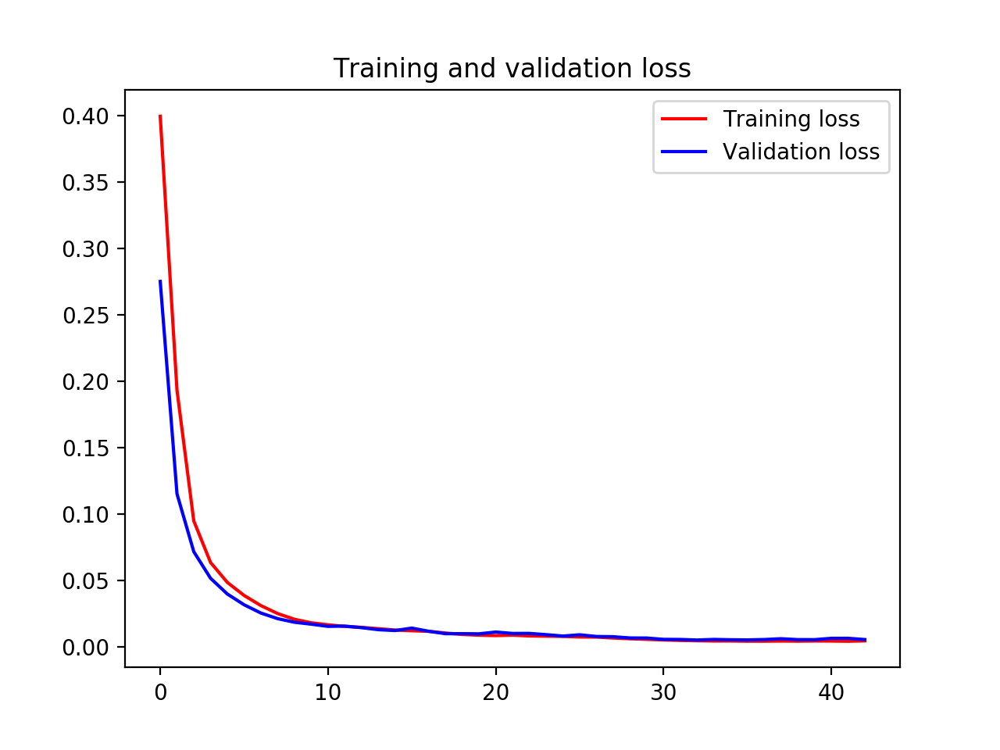

<IPython.core.display.Javascript object>


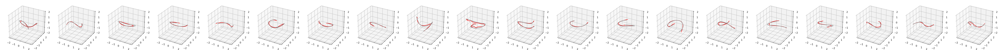

In [11]:
def autoEncoderLRELU():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300)(x)
    x=LeakyReLU(alpha=0.01)(x)
    x=Dense(200)(x)
    x=LeakyReLU(alpha=0.01)(x)
    x=Dense(100)(x)
    encoded=LeakyReLU(alpha=0.01)(x)

    # Decoding
    x=Dense(200)(encoded)
    x=LeakyReLU(alpha=0.01)(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderLRELU, encoderLRELU=autoEncoderLRELU()
testAutoEncoder(autoencoderLRELU, encoderLRELU, x_train, x_test, filepath='AE_LRELU')

# 2. Effect of Latent space Z=2,3,10,15,30,60,300 on Dense Auto-Encoders

The nodes in Z-space determines the dimensionity reduction carried out by an auto-encoder. However, if the z-space is too small, the accuracy of reconstruction is adversely affected. Thus, we carry an emperical analysis to find the best accuracy-dimentionality tradeoff.

| Z-Space Dimension   | Final Training Loss | Final Validation Loss | 
| ------------------- |:-------------------:| ---------------------:| 
| 2                   | 0.0359              | 0.0399                | 
| 3                   | 0.0285              | 0.0382                | 
| 10                  | 0.0098              | 0.0146                | 
| 15                  | 0.0072              | 0.0120                | 
| 30                  | 0.0035              | 0.0059                | 
| 60                  | 0.0017              | 0.0029                |
| 300                 | 0.0009              | 0.0016                | 


Reconstruction losses for Z=2,3,10 are significant. However, we don't observe a lot of improvement in reconstructed results after Z=30. Thus, exploring architectures from Z=15 to Z=30 seems to be the sweet spot.

## 2.1 Autoencoder Z=2

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        (None, 100, 3)            0         
_________________________________________________________________
flatten_12 (Flatten)         (None, 300)               0         
_________________________________________________________________
dense_72 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_73 (Dense)             (None, 30)                3030      
_________________________________________________________________
dense_74 (Dense)             (None, 20)                620       
_________________________________________________________________
dense_75 (Dense)             (None, 10)                210       
_________________________________________________________________
dense_76 (Dense)             (None, 5)                 55        
__________

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


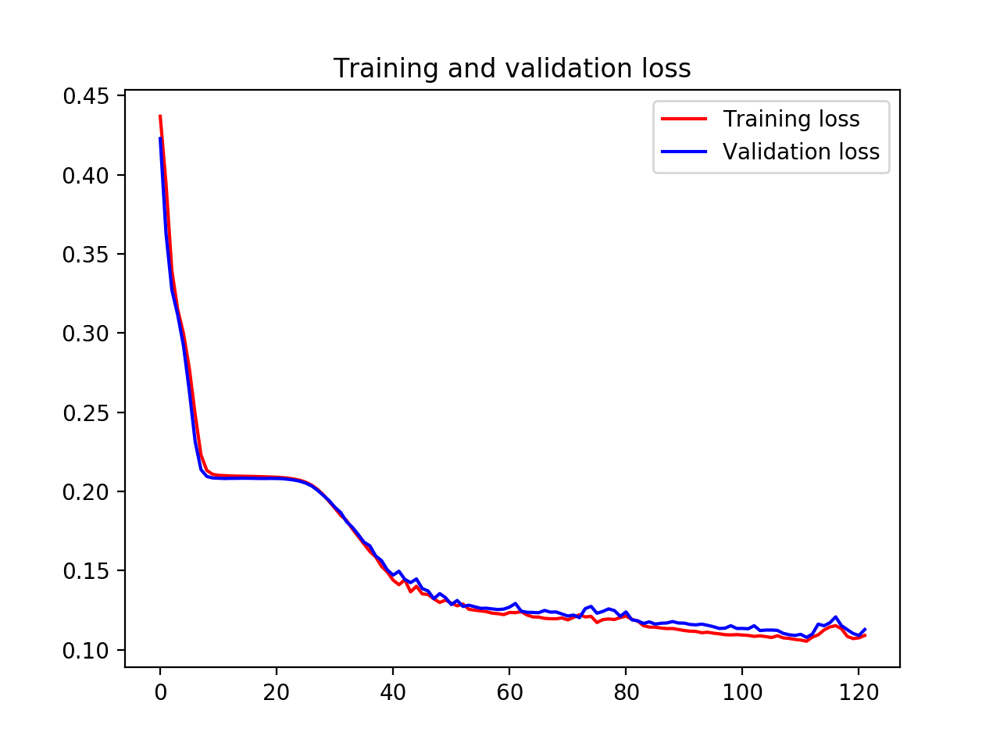

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


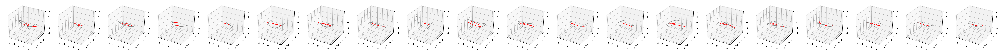

In [24]:
def autoEncoderZ2():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(20, activation='relu')(x)
    x=Dense(10, activation='relu')(x)
    x=Dense(5, activation='relu')(x)
    encoded=Dense(2, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(5, activation='relu')(encoded)
    x=Dense(10, activation='relu')(x)
    x=Dense(20, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ2, encoderZ2=autoEncoderZ2()
testAutoEncoder(autoencoderZ2, encoderZ2, x_train, x_test, filepath='AE_Z2')

## 2.2 Autoencoder Z=3

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_28 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_29 (Dense)             (None, 30)                3030      
_________________________________________________________________
dense_30 (Dense)             (None, 20)                620       
_________________________________________________________________
dense_31 (Dense)             (None, 10)                210       
_________________________________________________________________
dense_32 (Dense)             (None, 3)                 33        
__________

<IPython.core.display.Javascript object>


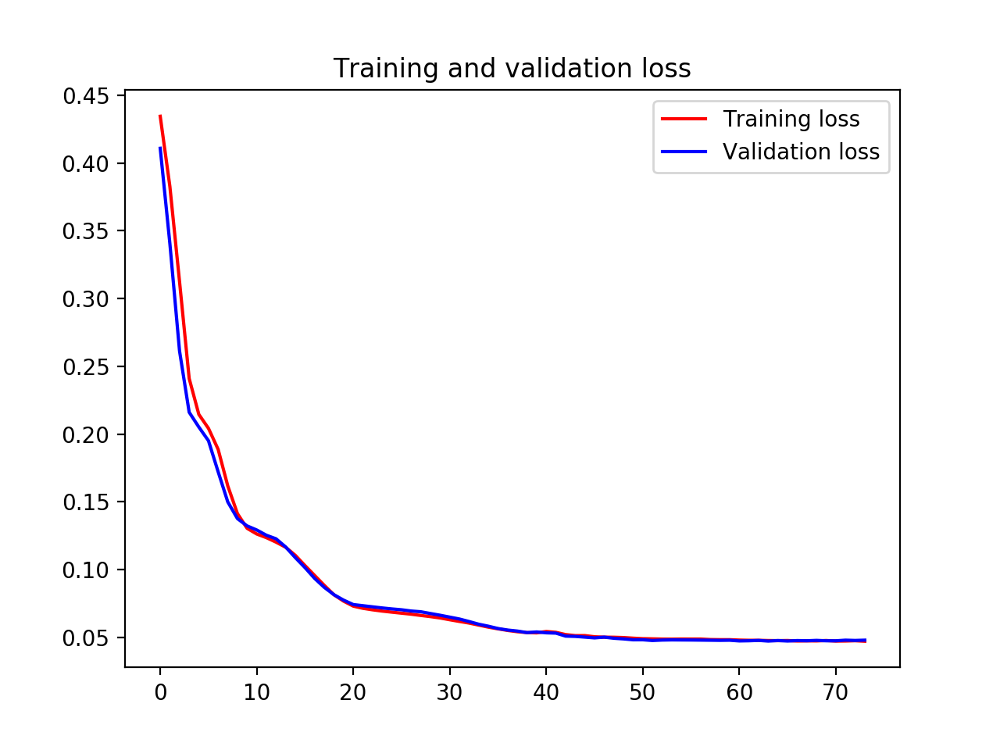

<IPython.core.display.Javascript object>


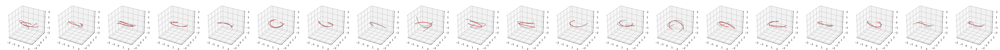

In [13]:
def autoEncoderZ3():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(20, activation='relu')(x)
    x=Dense(10, activation='relu')(x)
    encoded=Dense(3, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(10, activation='relu')(encoded)
    x=Dense(20, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ3, encoderZ3=autoEncoderZ3()
testAutoEncoder(autoencoderZ3, encoderZ3, x_train, x_test, filepath='AE_Z3')

## 2.3 Autoencoder Z=10

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_38 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_39 (Dense)             (None, 50)                5050      
_________________________________________________________________
dense_40 (Dense)             (None, 25)                1275      
_________________________________________________________________
dense_41 (Dense)             (None, 10)                260       
_________________________________________________________________
dense_42 (Dense)             (None, 25)                275       
__________

<IPython.core.display.Javascript object>


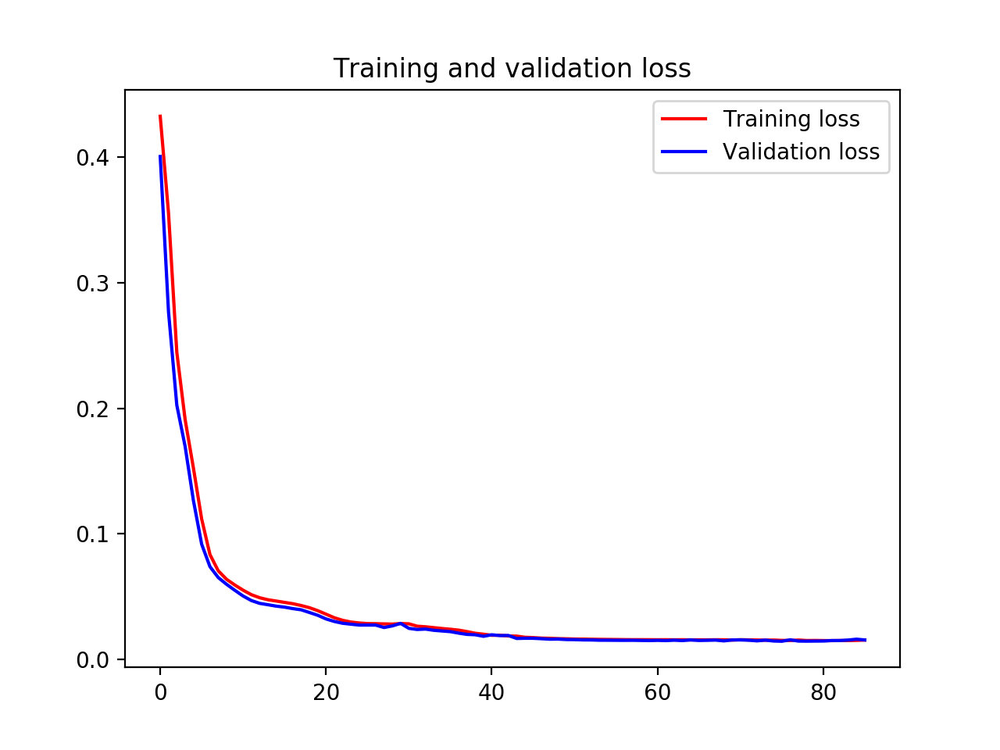

<IPython.core.display.Javascript object>


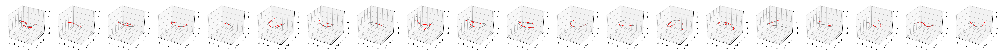

In [14]:
def autoEncoderZ10():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(50, activation='relu')(x)
    x=Dense(25, activation='relu')(x)
    encoded=Dense(10, activation='relu')(x)

    # Decoding
    x=Dense(25, activation='relu')(encoded)
    x=Dense(50, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ10, encoderZ10=autoEncoderZ10()
testAutoEncoder(autoencoderZ10, encoderZ10, x_train, x_test, filepath='AE_Z10')

## 2.4 Autoencoder Z=15

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        (None, 100, 3)            0         
_________________________________________________________________
flatten_15 (Flatten)         (None, 300)               0         
_________________________________________________________________
dense_100 (Dense)            (None, 100)               30100     
_________________________________________________________________
dense_101 (Dense)            (None, 60)                6060      
_________________________________________________________________
dense_102 (Dense)            (None, 30)                1830      
_________________________________________________________________
dense_103 (Dense)            (None, 15)                465       
_________________________________________________________________
dense_104 (Dense)            (None, 30)                480       
__________

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


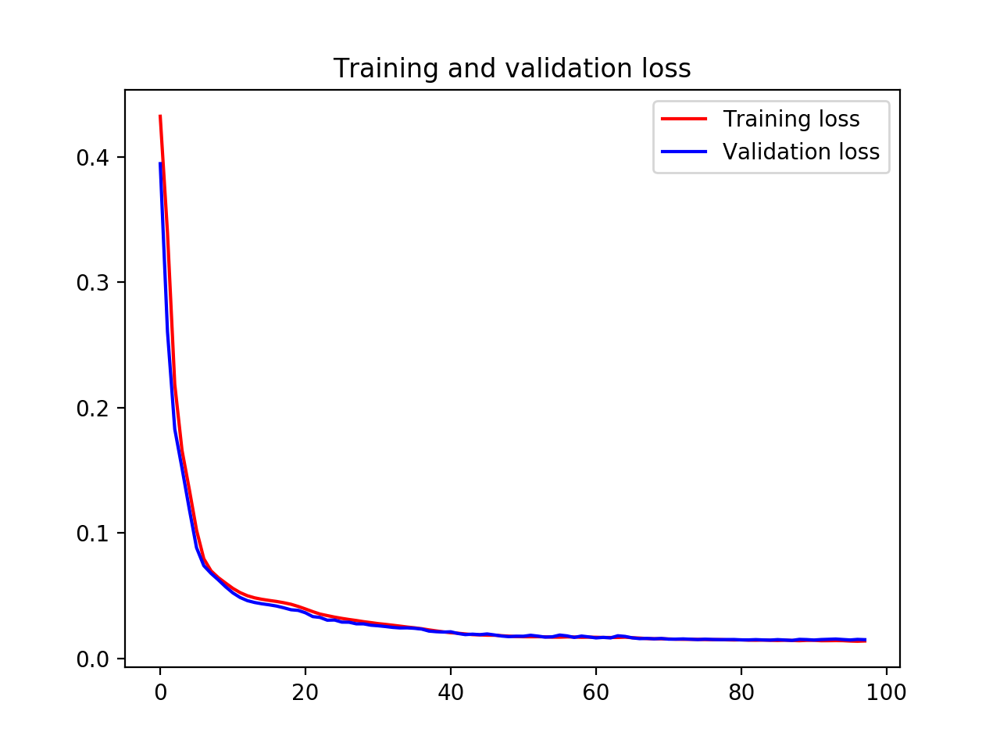

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


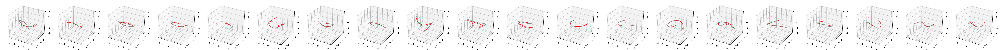

In [27]:
def autoEncoderZ15():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(60, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    encoded=Dense(15, activation='relu')(x)

    # Decoding
    x=Dense(30, activation='relu')(encoded)
    x=Dense(60, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ15, encoderZ15=autoEncoderZ15()
testAutoEncoder(autoencoderZ15, encoderZ15, x_train, x_test, filepath='AE_Z15')

## 2.5 Autoencoder Z=30

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_8 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_54 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_55 (Dense)             (None, 60)                6060      
_________________________________________________________________
dense_56 (Dense)             (None, 30)                1830      
_________________________________________________________________
dense_57 (Dense)             (None, 60)                1860      
_________________________________________________________________
dense_58 (Dense)             (None, 100)               6100      
__________

<IPython.core.display.Javascript object>


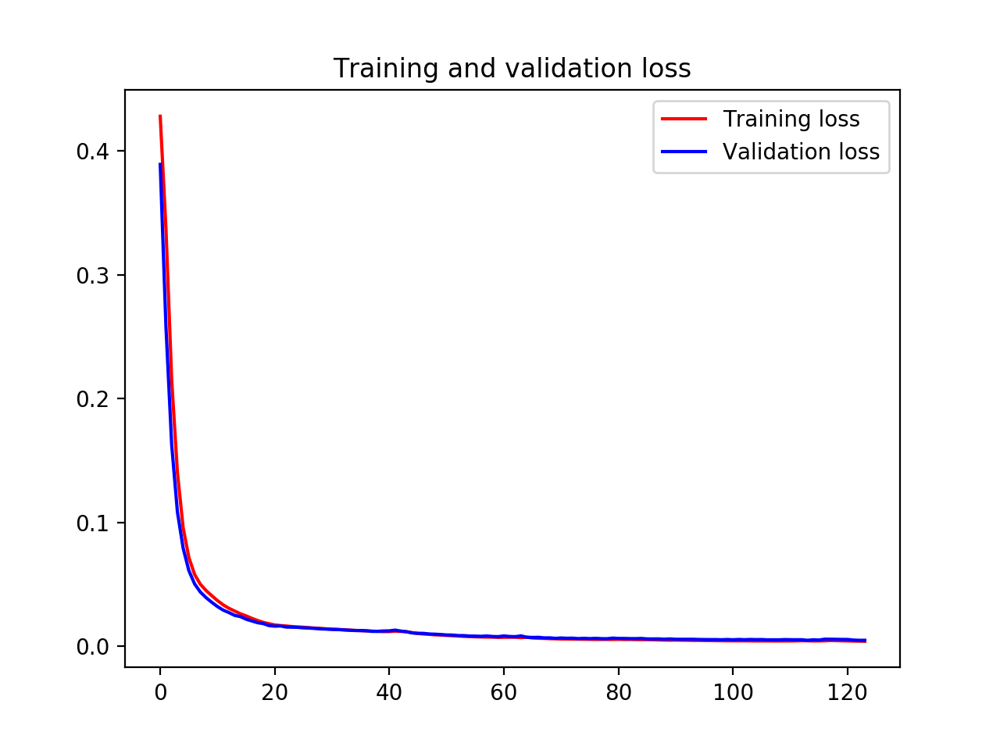

<IPython.core.display.Javascript object>


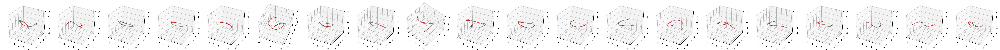

In [16]:
def autoEncoderZ30():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(60, activation='relu')(x)
    encoded=Dense(30, activation='relu')(x)

    # Decoding
    x=Dense(60, activation='relu')(encoded)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ30, encoderZ30=autoEncoderZ30()
testAutoEncoder(autoencoderZ30, encoderZ30, x_train, x_test, filepath='AE_Z30')

## 2.6 Autoencoder Z=60

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_9 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_60 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_61 (Dense)             (None, 60)                6060      
_________________________________________________________________
dense_62 (Dense)             (None, 100)               6100      
_________________________________________________________________
dense_63 (Dense)             (None, 300)               30300     
_________________________________________________________________
reshape_9 (Reshape)          (None, 100, 3)            0         
Total para

<IPython.core.display.Javascript object>


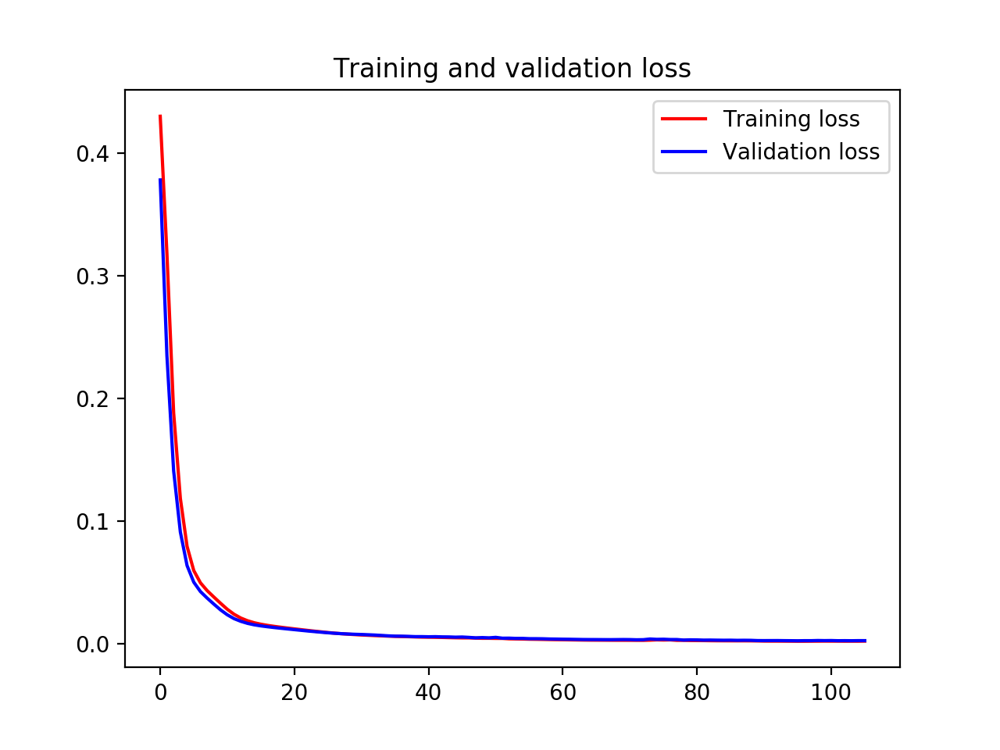

<IPython.core.display.Javascript object>


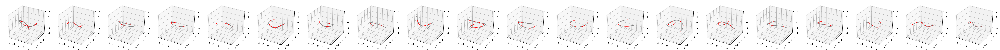

In [17]:
def autoEncoderZ60():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    encoded=Dense(60, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(100, activation='relu')(encoded)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ60, encoderZ60=autoEncoderZ60()
testAutoEncoder(autoencoderZ60, encoderZ60, x_train, x_test, filepath='AE_Z60')

## 2.7 AutoEncoder Z=300

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        (None, 100, 3)            0         
_________________________________________________________________
flatten_10 (Flatten)         (None, 300)               0         
_________________________________________________________________
dense_64 (Dense)             (None, 300)               90300     
_________________________________________________________________
dense_65 (Dense)             (None, 300)               90300     
_________________________________________________________________
dense_66 (Dense)             (None, 300)               90300     
_________________________________________________________________
reshape_10 (Reshape)         (None, 100, 3)            0         
Total params: 270,900
Trainable params: 270,900
Non-trainable params: 0
_________________________________________________________________
Rest

<IPython.core.display.Javascript object>


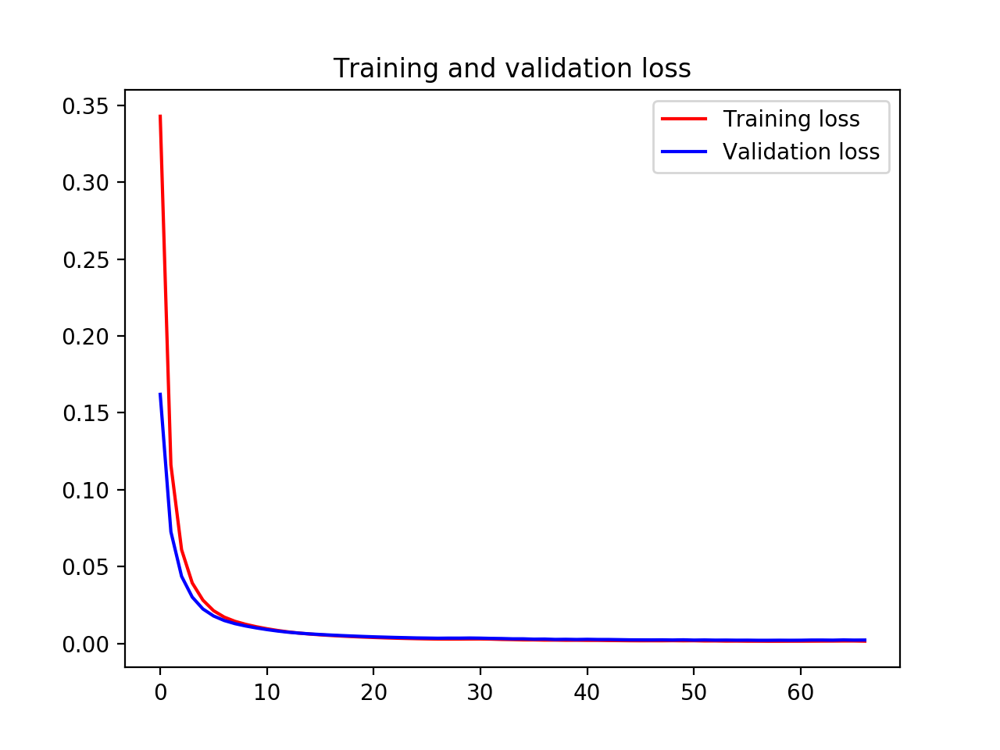

<IPython.core.display.Javascript object>


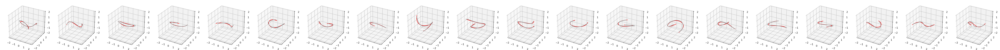

In [18]:
def autoEncoderZ300():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300, activation='relu')(x)
    encoded=Dense(300, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(300)(encoded)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ300, encoderZ300=autoEncoderZ300()
testAutoEncoder(autoencoderZ300, encoderZ300, x_train, x_test, filepath='AE_Z300')

# Perform Hierarchical Clustering (K-Mean)(also try Dendrogram)

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


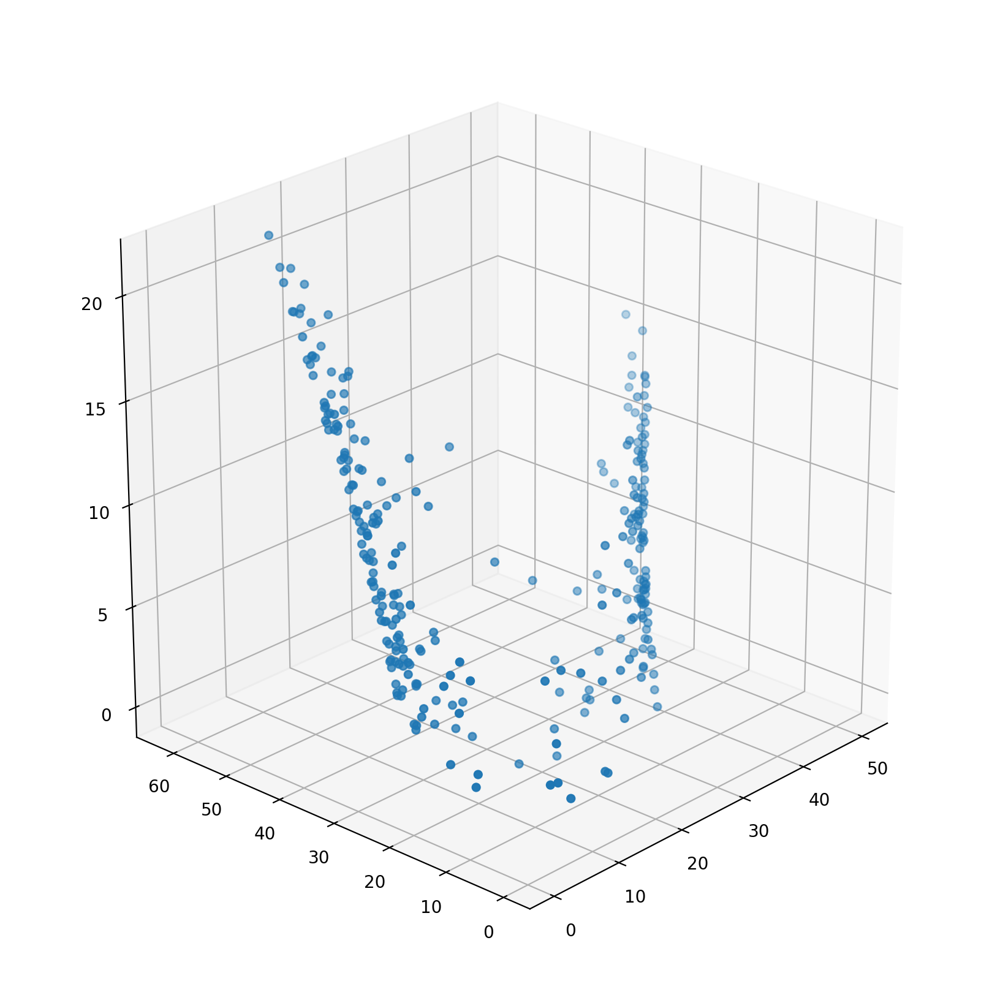

In [28]:
z_param = encoderZ3.predict(x_test)
#print(z_param)

fig = plt.figure(figsize=1.7*plt.figaspect(1))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter(z_param[:,0],z_param[:,1],z_param[:,2])

plt.tight_layout()
plt.show()

In [20]:
from sklearn.cluster import KMeans

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


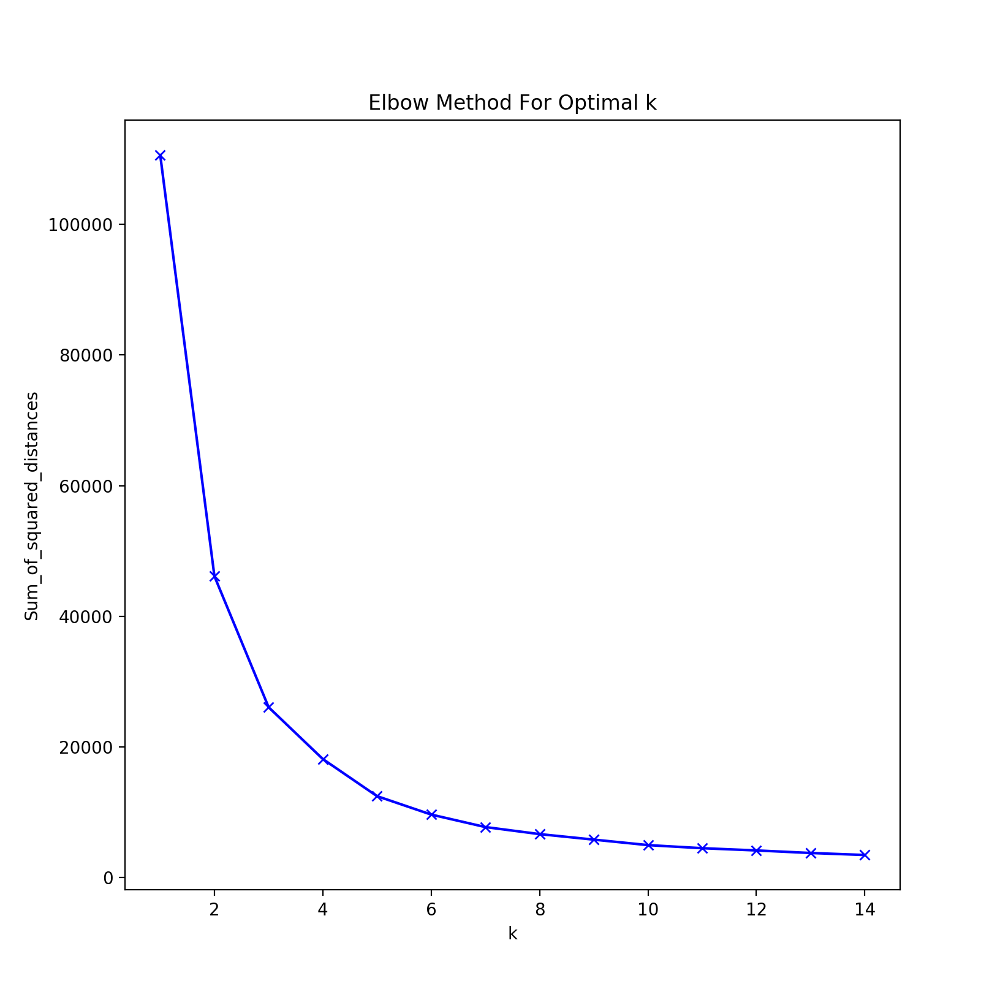

In [21]:
#Find optimal K-value using the elbow method
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(z_param)
    Sum_of_squared_distances.append(km.inertia_)

fig = plt.figure(figsize=1.7*plt.figaspect(1))
ax = fig.add_subplot(1, 1, 1)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


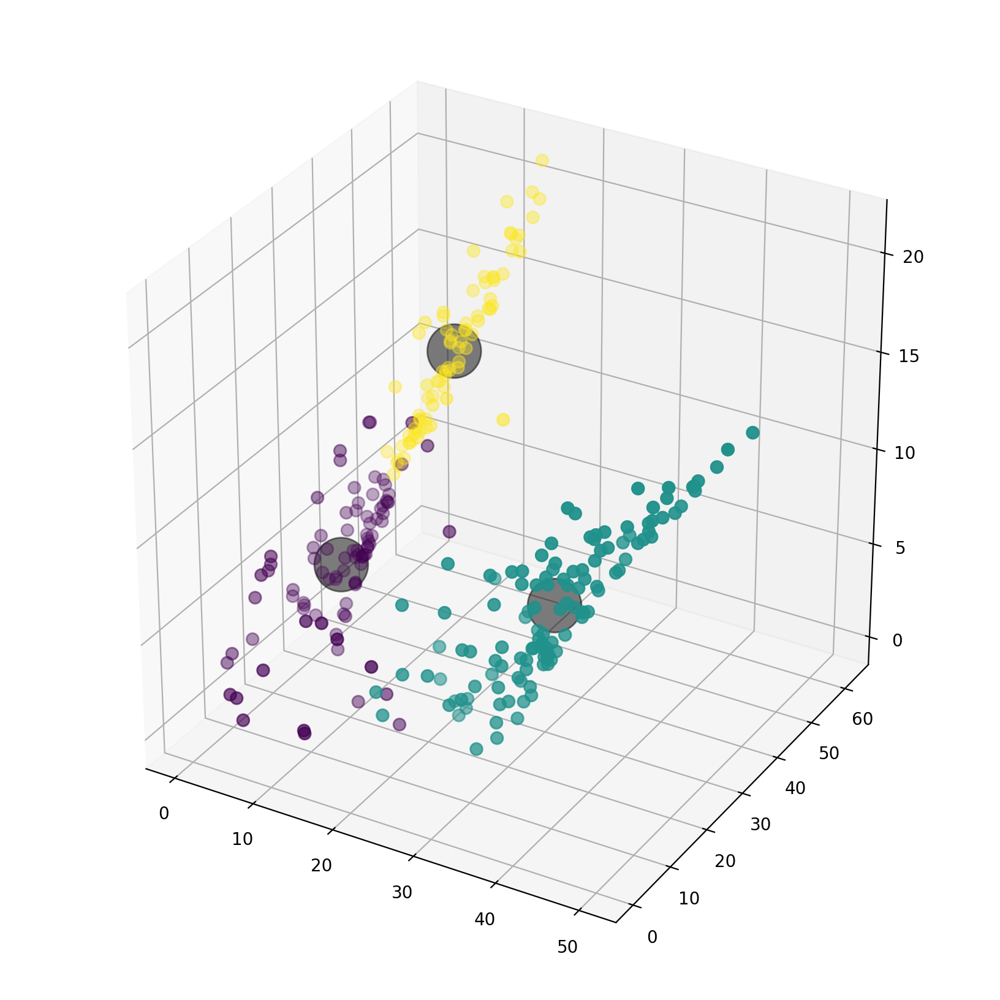

In [22]:
optK=3
kmeans = KMeans(n_clusters=optK)
kmeans.fit(z_param)
y_kmeans = kmeans.predict(z_param)

centers = kmeans.cluster_centers_
fig = plt.figure(figsize=1.7*plt.figaspect(1))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter(z_param[:, 0], z_param[:, 1], z_param[:, 2], c=y_kmeans, s=50, cmap='viridis')
ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2], c='black', s=1000, alpha=0.5);

plt.tight_layout()

# Find similar paths using KNN on Cluster Centers